# BICYCLE DATA QUALITY

## (02a) Intrinsic analysis of reference bicycle network data

**Overview:**

This notebook analyses the quality of OSM data on bicycle infrastructure for a given area. The quality assessment is **intrinsic**, i.e., based only on the input data set, and making no use of information external to the data set. (For an extrinsic quality assessment that compares the OSM data set to a reference data set provided by the user, see the notebooks **03a** and **03b**).

The purpose of the analysis is to assess the *fitness for purpose* ([Barron et al., 2014](https://onlinelibrary.wiley.com/doi/10.1111/tgis.12073)) of OSM data for a given area. Outcomes of the analysis can be relevant both for bicycle planning and research - particularly for projects that include a network analysis of bicycle infrastructure, in which case the topology of the geometries is of particular importance.

Since the assessment do not make use of an external reference dataset as the ground truth, no universal claims of data quality can be made. The idea is much rather to enable the those working with bicycle networks to assess whether the data is good enough for their particular use case.

The various steps in the analysis thus attempts to highlight issues that might undermine the quality of analyses based on the data but leaves the final interpretation of the results to the end user.

The notebook makes use of quality metrics from a range of previous projects investigating OSM/VGI data quality, such as [Antoniou & Skopeliti (2015)](https://www.isprs-ann-photogramm-remote-sens-spatial-inf-sci.net/II-3-W5/345/2015/), [Fonte et al. (2017)](https://www.ubiquitypress.com/site/chapters/e/10.5334/bbf.g/) and [Fester et al. (2020)](https://www.tandfonline.com/doi/full/10.1080/15568318.2018.1519746). 

Output files of this notebook are saved to the `../results/reference/'study_area'/` subfolder.

**For a correct interpretation of some of the metrics for spatial data quality, some familiarity with the area is necessary.**

***

**Sections:**

1. Data completeness
    - Network Density
2. Network Topology
    - Simplification/graph conversion outcome
    - Dangling nodes
    - Over/undershoots
3. Network components
    - Disconnected components
    - Missing component links
4. Summary
5. Save results
****

**Load libraries, settings and data:**

In [1]:
import json
import pickle
from collections import Counter

import contextily as cx
import folium
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import osmnx as ox
import pandas as pd
import yaml
from matplotlib import cm, colors
import warnings

from src import evaluation_functions as eval_func
from src import plotting_functions as plot_func

%run ../settings/yaml_variables.py
%run ../settings/plotting.py
%run ../settings/tiledict.py
%run ../settings/load_refdata.py
%run ../settings/df_styler.py
%run ../settings/paths.py

warnings.filterwarnings('ignore')

grid = ref_grid 

Reference graphs loaded successfully!
Reference data loaded successfully!


__________________

## 1. Data completeness

### Network Density

#### Why?

Network density[1] without comparing to a reference dataset does not in itself indicate spatial data quality. For anyone familiar with the study area, network density can however indicate whether parts of the area appear to be under- or over-mapped and is thus included here.

#### How?

The density here is not based on the geometric length of edges, but instead on the computed length of the infrastructure. For example, a 100-meter-long bidirectional path contributes with 200 meters of bicycle infrastructure. With `compute_network_density`, the number of elements (nodes; dangling nodes; and total infrastructure length) per unit area is calculated. The density is computed twice: first for the study area for both the entire network ('global density'), then for each of the grid cells ('local density'). Both global and local densities are computed for the entire network and for respectively protected and unprotected infrastructure.

#### What could it mean?

Since the analysis conducted here is intrinsic, i.e., it makes no use of external information, it cannot be know whether a low-density value is due to incomplete mapping, or due to actual lack of infrastructure in the area. However, a comparison of the grid cell density values can provide some insights, for example:
* lower-than-average infrastructure density indicates a locally sparser network
* higher-than-average node density indicates a that there are relatively many intersections in the grid cell
* higher-than-average dangling node density indicates that there are relatively many dead ends in the grid cell

[1] In this setting, network density refers to the length of edges or number of nodes per square kilometer (i.e., the definition of network density usually used when looking at street networks, which is distinct from the definition usually found in graph theory)

#### Global network density

In [2]:
# Entire study area
edge_density, node_density, dangling_node_density = eval_func.compute_network_density(
    (ref_edges_simplified, ref_nodes_simplified),
    grid.unary_union.area,
    return_dangling_nodes=True,
)

density_results = {}
density_results["edge_density_m_sqkm"] = edge_density
density_results[ "node_density_count_sqkm"] = node_density
density_results["dangling_node_density_count_sqkm"] = dangling_node_density

ref_protected = ref_edges_simplified.loc[ref_edges_simplified.protected=='protected']
ref_unprotected = ref_edges_simplified.loc[ref_edges_simplified.protected=='unprotected']
ref_mixed = ref_edges_simplified.loc[ref_edges_simplified.protected=='mixed']

ref_data = [ref_protected, ref_unprotected, ref_mixed]
labels = ['protected_density', 'unprotected_density', 'mixed_density']

for data, label in zip(ref_data, labels):
    if len(data) > 0:
        ref_edge_density_type, _ = eval_func.compute_network_density((data, ref_nodes_simplified),grid.unary_union.area, return_dangling_nodes=False)
        density_results[label+'_m_sqkm'] = ref_edge_density_type
    else:
        density_results[label+'_m_sqkm'] = 0
        
protected_edge_density = density_results['protected_density_m_sqkm']
unprotected_edge_density = density_results['unprotected_density_m_sqkm']
mixed_protection_edge_density = density_results['mixed_density_m_sqkm']

print(f"For the entire study area, there are:")
print(f"- {edge_density:.2f} meters of bicycle infrastructure per square km.")
print(f"- {node_density:.2f} nodes in the bicycle network per square km.")
print(f"- {dangling_node_density:.2f} dangling nodes in the bicycle network per square km.")
print(f"- {protected_edge_density:.2f} meters of protected bicycle infrastructure per square km.")
print(f"- {unprotected_edge_density:.2f} meters of unprotected bicycle infrastructure per square km.")
print(f"- {mixed_protection_edge_density:.2f} meters of mixed protection bicycle infrastructure per square km.")


For the entire study area, there are:
- 3453.85 meters of bicycle infrastructure per square km.
- 22.74 nodes in the bicycle network per square km.
- 4.80 dangling nodes in the bicycle network per square km.
- 2998.80 meters of protected bicycle infrastructure per square km.
- 455.05 meters of unprotected bicycle infrastructure per square km.
- 0.00 meters of mixed protection bicycle infrastructure per square km.


In [3]:
# Save stats to csv
pd.DataFrame(
    {
        "metric": [
            "meters of bicycle infrastructure per square km",
            "nodes in the bicycle network per square km",
            "dangling nodes in the bicycle network per square km",
            "meters of protected bicycle infrastructure per square km",
            "meters of unprotected bicycle infrastructure per square km",
            "meters of mixed protection bicycle infrastructure per square km"
        ],
        "value": [
            np.round(edge_density, 2),
            np.round(node_density, 2),
            np.round(dangling_node_density, 2),
            np.round(protected_edge_density, 2),
            np.round(unprotected_edge_density, 2),
            np.round(mixed_protection_edge_density, 2),
        ],
    }
).to_csv(ref_results_data_fp + "stats_area.csv", index=False)

#### Local network density

In [4]:
# Per grid cell
results_dict = {}
data = (ref_edges_simp_joined, ref_nodes_simp_joined.set_index("osmid"))

[
    eval_func.run_grid_analysis(
        grid_id,
        data,
        results_dict,
        eval_func.compute_network_density,
        grid["geometry"].loc[grid.grid_id == grid_id].area.values[0],
        return_dangling_nodes=True,
    )
    for grid_id in grid_ids
]

results_df = pd.DataFrame.from_dict(results_dict, orient="index")
results_df.reset_index(inplace=True)
results_df.rename(
    columns={
        "index": "grid_id",
        0: "ref_edge_density",
        1: "ref_node_density",
        2: "ref_dangling_node_density",
    },
    inplace=True,
)

grid = eval_func.merge_results(grid, results_df, "left")

ref_protected = ref_edges_simp_joined.loc[ref_edges_simp_joined.protected=='protected']
ref_unprotected = ref_edges_simp_joined.loc[ref_edges_simp_joined.protected=='unprotected']
ref_mixed = ref_edges_simp_joined.loc[ref_edges_simp_joined.protected=='mixed']

ref_data = [ref_protected, ref_unprotected, ref_mixed]

ref_labels = ['ref_protected_density', 'ref_unprotected_density','ref_mixed_density']

for data, label in zip(ref_data, ref_labels):
    if len(data) > 0:
        results_dict = {}
        data = (ref_edges_simp_joined.loc[data.index], ref_nodes_simp_joined)
        [eval_func.run_grid_analysis(
            grid_id, data, 
            results_dict, 
            eval_func.compute_network_density, 
            grid['geometry'].loc[grid.grid_id==grid_id].area.values[0]) 
        for grid_id in grid_ids];

        results_df = pd.DataFrame.from_dict(results_dict, orient='index')
        results_df.reset_index(inplace=True)
        results_df.rename(columns={'index':'grid_id', 0:label}, inplace=True)
        results_df.drop(1,axis=1,inplace=True)

        grid = eval_func.merge_results(grid,results_df,'left')

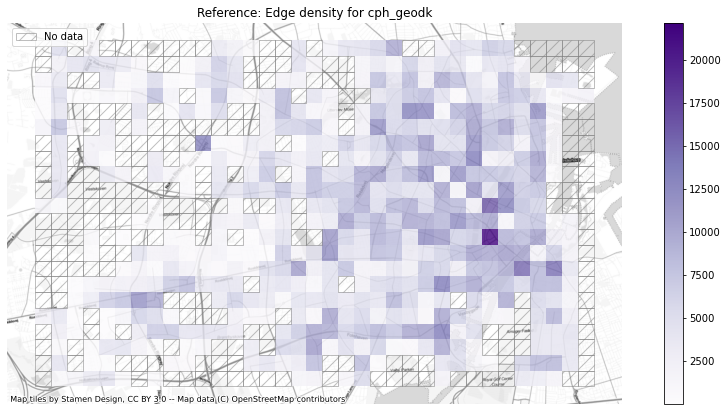

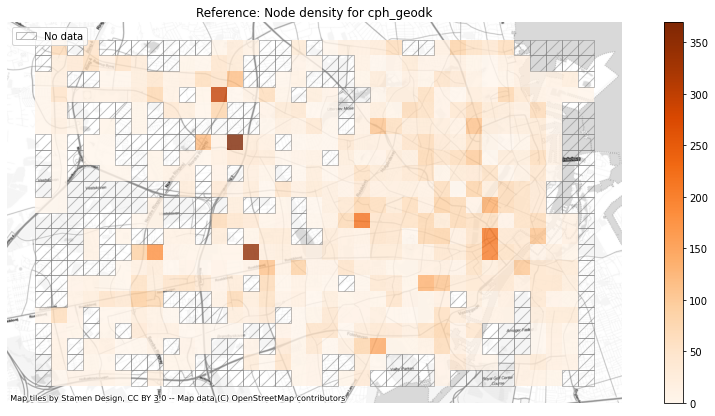

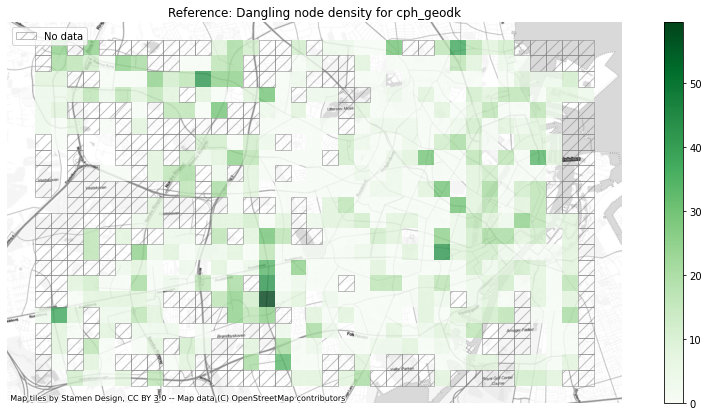

In [5]:
# Network density grid plots

plot_cols = ["ref_edge_density","ref_node_density", "ref_dangling_node_density"]
plot_titles = ["Reference: Edge density for " + study_area, "Reference: Node density for " + study_area, "Reference: Dangling node density for " + study_area]
filepaths = [ref_results_static_maps_fp + "density_edge_ref.png",ref_results_static_maps_fp + "density_node_ref.png", ref_results_static_maps_fp + "density_danglingnode_ref.png"]
cmaps = [pdict["edgeden"],pdict["nodeden"],pdict["dens"]]
no_data_cols = ["count_ref_edges", "count_ref_nodes", "count_ref_nodes"]

plot_func.plot_grid_results(grid=grid, plot_cols=plot_cols, plot_titles=plot_titles, 
    filepaths=filepaths, cmaps=cmaps, alpha=pdict["alpha_grid"],cx_tile=cx_tile_2,no_data_cols=no_data_cols,)

**Densities of protected and unprotected infrastructure:**

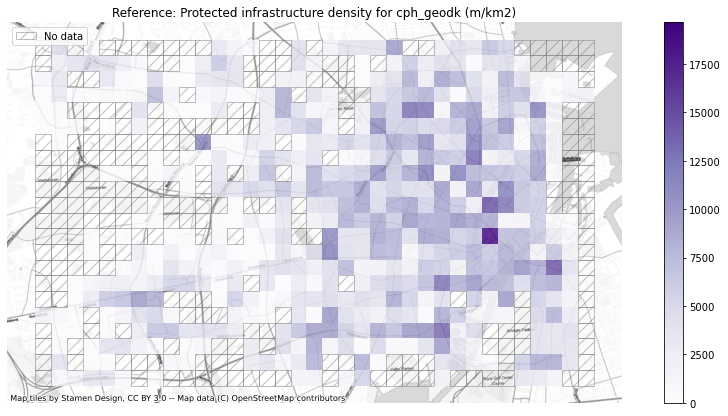

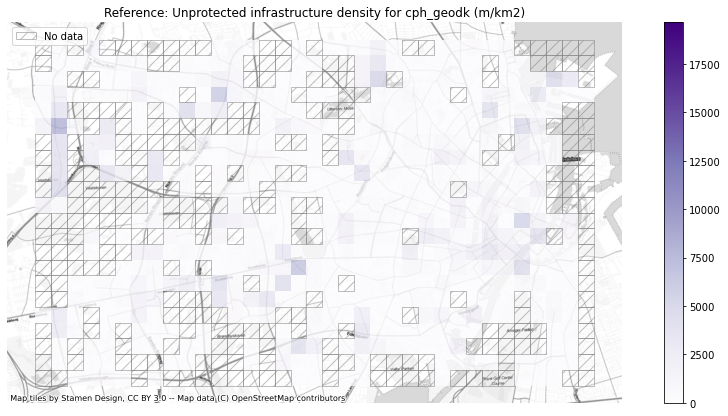

In [7]:
# Network density grid plots

plot_cols = ["ref_protected_density", "ref_unprotected_density","ref_mixed_density"]

plot_cols = [p for p in plot_cols if p in grid.columns]

plot_titles = ['Reference: Protected infrastructure density for ' + study_area + " (m/km2)", 
    'Reference: Unprotected infrastructure density for ' + study_area + " (m/km2)", 
    "Reference: Mixed protection infrastructure density for " + study_area + " (m/km2)"
    ]

#plot_titles = plot_titles[0:len(plot_cols)]

filepaths = [ref_results_static_maps_fp + "density_protected_ref.png",
    ref_results_static_maps_fp + "density_unprotected_ref.png", 
    ref_results_static_maps_fp + "density_mixed_ref.png"]

cmaps = [pdict["edgeden"]]*3
no_data_cols = ["ref_protected_density", "ref_unprotected_density", "ref_mixed_density"]
norm_min = 0
norm_max = max(grid[plot_cols].fillna(value=0).max())

plot_func.plot_grid_results(grid=grid, plot_cols=plot_cols, plot_titles=plot_titles, filepaths=filepaths, 
cmaps=cmaps, alpha=pdict["alpha_grid"],cx_tile=cx_tile_2,no_data_cols=no_data_cols,use_norm=True,norm_min=0,norm_max=norm_max)


______________________

## 2. Network topology

This section explores the geometric and topological features of the data.

These are, for example, network density, disconnected components, dangling (degree one) nodes; it also includes exploring whether there are nodes in close proximity, that do not share an edge - a potential sign of edge undershoots - or if there are intersecting edges without a node at the intersection, which might indicate a digitizing error that will distort any attempts at routing on the network.

It is important to note that due to the fragmented nature of most networks of bicycle infrastructure, many metrics, such as missing links or network gaps, simply reflect the true extent of the infrastructure ([Natera Orozco et al., 2020](https://onlinelibrary.wiley.com/doi/pdfdirect/10.1111/gean.12324)). This is different for car networks, where e.g., disconnected components could more readily be interpreted as a data quality issue.

Therefore, the analysis only takes very small network gaps into account as potential data quality issues.

**Subsections:**
1. Simplification outcomes
2. Network density (nodes and edges)
3. Dangling nodes
4. Network components
5. Snapping issues

### Simplification & graph conversion outcome

When converting a set of geocoded linestrings (polygonal chains) to graph format, not all vertices (nodes) are of equal meaning. For geometry of the infrastructural element, all nodes are needed as an ordered list. For the topology of the network, however, only those nodes that are endpoints or intersection points with other edges are needed, while all other (so-called 'interstitial') nodes do not add any information. To compare the structure and true ratio between nodes and edges in a network, a simplified network representation which only includes nodes at endpoints and intersections, or where the value of important attributes changes, is required. Therefore, in the notebook `01_load_data` the bicycle network was simplified by removing all interstitial nodes from the graph object (retaining, however, the complete node lists in the geometry attribute of each edge). An additional advantage of simplifying the network is the resulting substantial reduction of the number of nodes and edges, which makes computational routines much faster.

#### Why?

Comparing the node degree distribution for the networks before and after simplification is a quick sanity check for the simplification routine. Typically, the big majority of nodes in the non-simplified network will be of degree two; in the simplified network, however, most nodes will have degrees other than two. Degree two nodes are retained in only two cases: if they represent a connection point between two different types of infrastructure; or if they are needed in order to avoid self-loops (edges whose start and end points are identical) or multiple edges between the same pair of nodes. 

As part of the simplification routine, in cases where there are several edges between the same pair of nodes ('parallel edges' or 'multiedges'), only one of the edges is retained. Within the routine, the number edges removed in this way are counted. 

#### How?

Below is printed both the node degree distributions before and after simplification, and the information on parallel edges removed by the simplification routine.

#### What could it mean?

Typically, the node degree distribution will go from high (before simplification) to low (after simplification) counts of degree two nodes, while it will not change for all other degrees (1, or 3 and higher). Further, the total number of nodes will see a strong decline. If the simplified graph still maintains a relatively high number of degree two nodes, or if the number of nodes with other degrees changes after the simplification, this might point to issues either with the graph conversion or with the simplification process.

The instances where parallel edges between the same pair of nodes were removed are a potential data quality issue of 'over-mapping', where one infrastructure element is represented by several identical or nearly identical features. Alternatively, if many parallel edges are present in the data set, this could point to a problem in the conversion from linestrings to graph format, for example in how nodes are defined.

<div class="alert alert-block alert-info">
<b>User configurations</b>
<br>
<br>
Note that the choice of attributes used for defining distinct network edges in the simplification function in the <a href="01a_load_osm.ipynb">data loading notebook</a> will influence the result of the network simplification function. The more attributes provided, the fewer edges will be merged during the simplification processs.
</div>

#### Simplification outcome

In [9]:
# Decrease in network elements after simplification
edge_percent_diff = (len(ref_edges) - len(ref_edges_simplified)) / len(ref_edges) * 100
node_percent_diff = (len(ref_nodes) - len(ref_nodes_simplified)) / len(ref_nodes) * 100

simplification_results = {
    "edge_percent_diff": edge_percent_diff,
    "node_percent_diff": node_percent_diff,
}

print(
    f"Simplifying the network decreased the number of edges with {edge_percent_diff:.1f}% and the number of nodes with {node_percent_diff:.1f} %"
)

Simplifying the network decreased the number of edges with 91.2% and the number of nodes with 92.2 %


Before the network simplification the graph had:
- 7 node(s) with degree 5
- 591 node(s) with degree 4
- 827 node(s) with degree 3
- 50705 node(s) with degree 2
- 870 node(s) with degree 1


After the network simplification the graph had:
- 7 node(s) with degree 5
- 591 node(s) with degree 4
- 827 node(s) with degree 3
- 1830 node(s) with degree 2
- 870 node(s) with degree 1


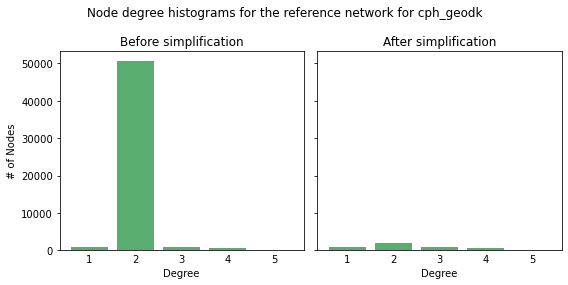

In [11]:
# Node degree distribution

fig, ax = plt.subplots(1, 2, figsize=(8, 4), sharey=True)

degree_sequence_before = sorted((d for n, d in ref_graph.degree()), reverse=True)
degree_sequence_after = sorted(
    (d for n, d in ref_graph_simplified.degree()), reverse=True
)

ax[0].bar(*np.unique(degree_sequence_before, return_counts=True), color=pdict["base"])
ax[0].set_title("Before simplification")
ax[0].set_xlabel("Degree")
ax[0].set_ylabel("# of Nodes")

ax[1].bar(*np.unique(degree_sequence_after, return_counts=True), color=pdict["base"])
ax[1].set_title("After simplification")
ax[1].set_xlabel("Degree")

plt.suptitle(f"Node degree histograms for the reference network for {study_area}")

fig.tight_layout()

before = dict(Counter(degree_sequence_before))
after = dict(Counter(degree_sequence_after))

print("Before the network simplification the graph had:")
for k, v in before.items():
    print(f"- {v} node(s) with degree {k}")

print("\n")

print("After the network simplification the graph had:")
for k, v in after.items():
    print(f"- {v} node(s) with degree {k}")

plt.show()

#### Analysis of multiple edges

In [12]:
# Get df and dict of multiedges (removed by simplification routine)

# format: str to int
ref_edges_simplified["multiedge"] = ref_edges_simplified["multiedge"].astype(int)

# get list of multiple edges
multiple_edges = ref_edges_simplified[ref_edges_simplified["multiedge"] > 0].copy()

# save results to dict (for later json saving)
multiple_edges_results = list(multiple_edges.index)

In [14]:
# Folium plot of multiple edges identified by simplification routine

if len(multiple_edges) > 0:

    simplified_edges_folium = plot_func.make_edgefeaturegroup(
        gdf=ref_edges_simplified,
        mycolor=pdict["ref_base"],
        myweight=pdict["line_base"],
        nametag="All edges",
        show_edges=True,
    )

    multiple_edges_folium = plot_func.make_edgefeaturegroup(
        gdf=multiple_edges,
        myweight=pdict["line_emp2"],
        mycolor=pdict["ref_emp"],
        nametag="Multiple edges",
        show_edges=True,
    )

    m = plot_func.make_foliumplot(
        feature_groups=[simplified_edges_folium, multiple_edges_folium],
        layers_dict=folium_layers,
        center_gdf=ref_nodes_simplified,
        center_crs=ref_nodes_simplified.crs,
    )

    bounds = plot_func.compute_folium_bounds(ref_nodes_simplified)
    m.fit_bounds(bounds)
    m.save(ref_results_inter_maps_fp + "multiple_edges_map_REF.html")

    display(m)

else:
    print("No multiple edges to plot.")

No multiple edges to plot.


### Dangling nodes

#### Why?

Dangling nodes are nodes of degree one - in other words, nodes that have only one single edge attached to them. Most networks will naturally contain a number of dangling nodes. Dangling nodes can occur at actual dead-ends (representing a cul-de-sac), at the endpoints of certain features (e.g., when a bicycle path ends in the middle of a street), or in case of over/undershoots (as described in detail in the next section). The number of dangling nodes in a network does to some extent also depend on the digitization method, as shown in the illustration below. 

Therefore, the presence of dangling nodes is in itself not a sign of low data quality. However, a high number of dangling nodes in an area that is not known for suffering from many dead-ends can indicate digitization errors and problems with edge over/undershoots.

<img src='../../images/dangling_nodes_illustration.png' width=300 />  <img src='../../images/no_dangling_nodes_illustration.png' width=295 />

*Dangling nodes occur where road features end (left), but when separate features are joined at the end (right), there will be no dangling nodes*

#### How?

Below, a list of all dangling nodes is obtained with the help of `get_dangling_nodes`. Then, the network with all its nodes is plotted. The dangling nodes are shown in red; all other nodes are shown in black.

#### What could it mean?

We recommend a visual analysis in order to interpret the spatial distribution of dangling nodes, with particular attention to areas of high dangling node density. It is important to understand where dangling nodes come from: are they actual dead-ends or digitization errors (e.g., over/undershoots)? A higher number of digitization errors points to a lower quality of the data.

#### Dangling nodes

In [15]:
# Compute number of dangling nodes
dangling_nodes = eval_func.get_dangling_nodes(ref_edges_simplified, ref_nodes_simplified)

In [16]:
# Folium plot of dangling nodes

edges_simplified_folium = plot_func.make_edgefeaturegroup(
    gdf=ref_edges_simplified,
    mycolor=pdict["ref_base"],
    myweight=pdict["line_base"],
    nametag="edges",
    show_edges=True,
)

nodes_simplified_folium = plot_func.make_nodefeaturegroup(
    gdf=ref_nodes_simplified,
    mysize=pdict["mark_base"],
    mycolor=pdict["ref_base"],
    nametag="All nodes",
    show_nodes=True,
)

dangling_nodes_folium = plot_func.make_nodefeaturegroup(
    gdf=dangling_nodes,
    mysize=pdict["mark_emp"],
    mycolor=pdict["ref_emp"],
    nametag="Dangling nodes",
    show_nodes=True,
)

m = plot_func.make_foliumplot(
    feature_groups=[
        edges_simplified_folium,
        nodes_simplified_folium,
        dangling_nodes_folium,
    ],
    layers_dict=folium_layers,
    center_gdf=ref_nodes_simplified,
    center_crs=ref_nodes_simplified.crs,
)

bounds = plot_func.compute_folium_bounds(ref_nodes_simplified)
m.fit_bounds(bounds)


m.save(f"../../results/REFERENCE/{study_area}/folium_danglingmap_REF.html")

display(m)

### Under/overshoots 

#### Why?

When two nodes in a simplified network are placed within a distance of a few meters, but do not share a common edge, it is often have a case of an edge over/undershoot or another digitizing error. An overshoot occurs when two features meet and one of them extends beyond the other. An undershoot occurs when two features are supposed to meet, but instead are just in close proximity to each other. See the image below for an illustration of an overshoot (left) and an undershoot (right). For a more detailed explanation of over/undershoots, see the [GIS Lounge website](https://www.gislounge.com/digitizing-errors-in-gis/).

<img src='../../images/overshoot_illustration.png' width=300  />  <img src='../../images/undershoot_illustration.png' width=300 />

*Overshoots refer to situations where a line feature extends too far beyond at intersecting line, rather than ending at the intersection (left).* 
*Undershoots happen when two line features are not properly joined, for example at intersection (right)*

#### How?

**Overshoots:** First, the `length_tolerance` (in meters) is defined in the cell below. Then, with `find_overshoots`, all network edges that have a dangling node attached to them and that have a maximum length of `length_tolerance` are identifed as overshoots, and the results are plotted.

**Undershoots**: First, the `length_tolerance` (in meters) is defined in the cell below. Then, with `find_undershoots`, all pairs of dangling nodes that have a maximum of `length_tolerance` distance between them, are identified as undershoots, and the results are plotted.

The workflow for over/undershoot detection below is inspired by [Neis et al. 2012](https://www.mdpi.com/1999-5903/4/1/1).

#### What could it mean?

Note that over/undershoots are not necessarily always a data quality issue - they might be instead an accurate representation of the network conditions or of the digitization strategy (for example, a cycle path might end abruptly soon after a turn, which results in an overshoot; protected cycle paths are often digitized in OSM as interrupted at intersections, which results in intersection 'undershoots') 

The interpretation of the impact of over/undershoots on data quality is context dependent. For certain applications, such as routings, overshoots do not present a particular challenge; they can, however, pose an issue for other applications such as network analysis, given that they skew the network structure.  Undershoots, on the contrary, are a serious problem for routing applications, especially if only bicycle infrastructure is considered; they also pose a problem for network analysis, for example for any path-based metric, such as most centrality measures (e.g., betweenness centrality).

<div class="alert alert-block alert-info">
<b>User configurations</b>
<br>
<br>
In the analysis of over and undershoots, the user can modify the length tolerance for both over and undershoots. <br>
A length tolerance for overshoots of e.g. 3 meters means that only edge snippets with a length of 5 meters or less are considered overshoots.<br>
For undershoots, a tolerance of for example 5 meters means that only gaps of 5 meters or less are considered undershoots.
</div>

#### Over/undershoots

In [17]:
# USER INPUT: LENGTH TOLERANCE FOR OVER- AND UNDERSHOOTS
length_tolerance_over = 3
length_tolerance_under = 3

for s in [length_tolerance_over, length_tolerance_under]:
    assert isinstance(s, int) or isinstance(s, float), print(
        "Settings must be integer or float values!"
    )

In [18]:
### Overshoots
overshoots = eval_func.find_overshoots(
    dangling_nodes,
    ref_edges_simplified,
    length_tolerance_over,
    return_overshoot_edges=True,
)

print(
    f"{len(overshoots)} potential overshoots were identified with a length tolerance of {length_tolerance_over} meters."
)

### Undershoots
undershoot_dict, undershoot_nodes = eval_func.find_undershoots(
    dangling_nodes,
    ref_edges_simplified,
    length_tolerance_under,
    "edge_id",
    return_undershoot_nodes=True,
)

print(
    f"{len(undershoot_nodes)} potential undershoots were identified with a length tolerance of {length_tolerance_under} meters."
)

21 potential overshoots were identified with a length tolerance of 3 meters.
11 potential undershoots were identified with a length tolerance of 3 meters.


In [19]:
### Folium plot over/undershoots

simplified_edges_folium = plot_func.make_edgefeaturegroup(
    gdf=ref_edges_simplified,
    mycolor=pdict["ref_base"],
    myweight=pdict["line_base"],
    nametag="edges",
    show_edges=True,
)

fg = [simplified_edges_folium]

if len(overshoots) > 0 or len(undershoot_nodes) > 0:

    if len(overshoots) > 0:

        overshoots_folium = plot_func.make_edgefeaturegroup(
            gdf=overshoots,
            mycolor=pdict["ref_emp"],
            myweight=pdict["line_emp2"],
            nametag="Overshoots",
            show_edges=True,
        )

        fg.append(overshoots_folium)

    if len(undershoot_nodes) > 0:

        undershoot_nodes_folium = plot_func.make_nodefeaturegroup(
            gdf=undershoot_nodes,
            mysize=pdict["mark_emp"],
            mycolor=pdict["ref_emp2"],
            nametag="Undershoot nodes",
            show_nodes=True,
        )

        fg.append(undershoot_nodes_folium)

    m = plot_func.make_foliumplot(
        feature_groups=fg,
        layers_dict=folium_layers,
        center_gdf=ref_nodes_simplified,
        center_crs=ref_nodes_simplified.crs,
    )

    bounds = plot_func.compute_folium_bounds(ref_nodes_simplified)
    m.fit_bounds(bounds)

    m.save(ref_results_inter_maps_fp + f"overundershoots_REF_{length_tolerance_under}_{length_tolerance_over}.html")

    display(m)

if len(undershoot_nodes) == 0:
    print("No undershoots to plot.")
if len(overshoots) == 0:
    print("No overshoots to plot.")

___________________

## 3. Network components

### Disconnected components

#### Why?

Disconnected components do not share any elements (nodes/edges). In other words, there is no network path that could lead from one disconnected component to the other. As mentioned above, most real-world networks of bicycle infrastructure do consist of many disconnected components ([Natera Orozco et al., 2020](https://onlinelibrary.wiley.com/doi/pdfdirect/10.1111/gean.12324)). However, when two disconnected components are very close to each other, it might be a sign of a missing edge or another digitizing error.

#### How?

First, with the help of `return_components`, a list of all (disconnected) components of the network is obtained. The total number of components are printed and all components are plotted in different colors for visual analysis. Next, the component size distribution (by node number) and the distribution of total edge lengths (i.e., network length per component) is plotted, followed by a plot of the largest connected component. Finally, with `find_adjacent_components`, all components with less than `component_min_distance` meters between them are identified. 

#### What could it mean?

As with many of the previous analysis steps, knowledge of the area is crucial for a correct interpretation of component analysis. Given that the data represents the actual infrastructure accurately, bigger components indicate coherent network parts, while smaller components indicate scattered infrastructure (e.g., one single bicycle path along a street that does not connect to any other bicycle infrastructure). A high number of disconnected components in near vicinity of each other could indicate digitization errors or missing data. 

<div class="alert alert-block alert-info">
<b>User configurations</b>
<br>
<br>
In the analysis of potential missing links between components, the user must define the threshold for when the distance between two components is considered to be low enough that a digitization error is suspected.
</div>

#### Number of components

In [20]:
ref_components = eval_func.return_components(ref_graph_simplified)
print(
    f"The network in the study area consists of {len(ref_components)} disconnected components."
)

The network in the study area consists of 204 disconnected components.


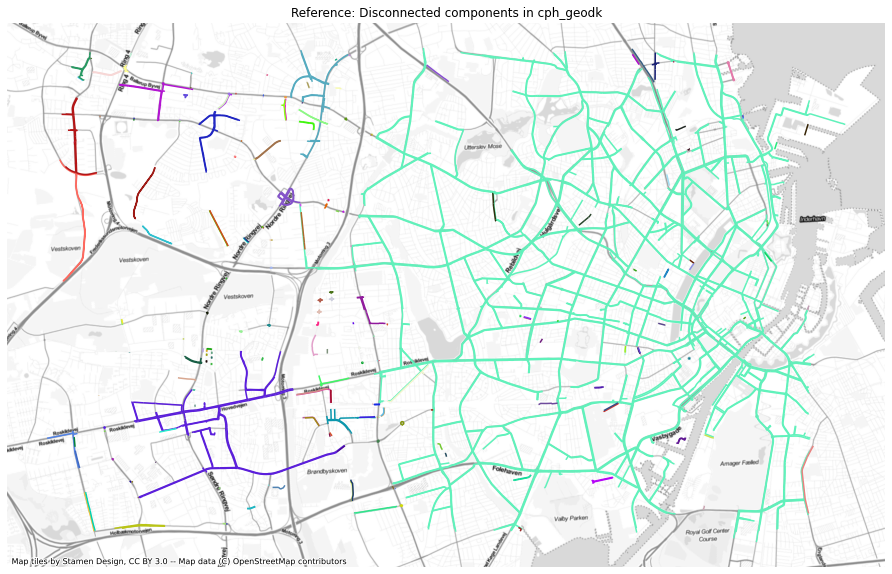

In [22]:
# set seed for colors
np.random.seed(42)

# generate enough random colors to plot all components
randcols = np.random.rand(len(ref_components), 3)

fig, ax = plt.subplots(1, 1, figsize=(20, 10))

ax.set_title(f"Reference: Disconnected components in {study_area}")

ax.set_axis_off()

for j, c in enumerate(ref_components):
    if len(c.edges) > 0:
        edges = ox.graph_to_gdfs(c, nodes=False)
        edges.plot(ax=ax, color=randcols[j])

cx.add_basemap(ax=ax, crs=study_crs, source=cx_tile_2)

#### Number of components per grid cell

In [23]:
# Assign component ids to grid
grid = eval_func.assign_component_id_to_grid(ref_edges_simplified, ref_edges_simp_joined, ref_components, grid, prefix='ref', edge_id_col='edge_id')

fill_na_dict = {'component_ids_ref': ''}
grid.fillna(value=fill_na_dict,inplace=True)

grid["component_count_ref"] = grid.component_ids_ref.apply(lambda x: len(x))

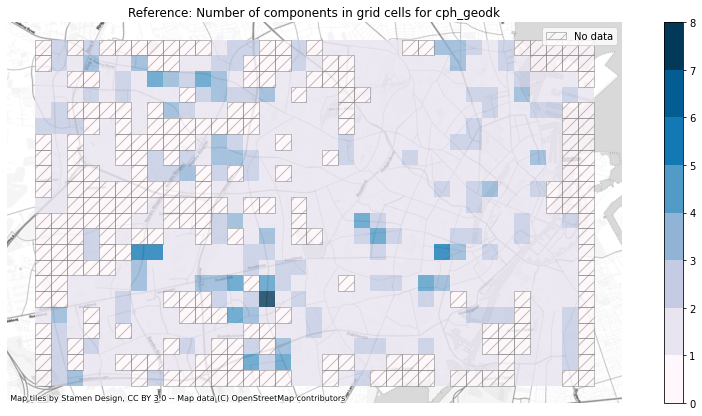

In [24]:

fig, ax = plt.subplots(1,1, figsize=pdict["fsmap"])

ncolors = grid["component_count_ref"].max()

mycm = cm.get_cmap(pdict["seq"], ncolors) 
grid.plot(
    ax=ax, 
    column = "component_count_ref",
    legend = True, 
    cmap = mycm,
    alpha = pdict["alpha_grid"])

# add no data patches
grid[grid["count_ref_edges"].isnull()].plot(
    ax=ax, facecolor=pdict["nodata_face"], edgecolor=pdict["nodata_edge"], hatch=pdict["nodata_hatch"], alpha=pdict["alpha_nodata"]
)

ax.legend(handles=[nodata_patch], loc="upper right")

cx.add_basemap(ax = ax, crs=study_crs, source=cx_tile_2)
ax.set_title('Reference: Number of components in grid cells for ' + study_area)
ax.set_axis_off()

fig.savefig(ref_results_static_maps_fp + f"number of components_in_grid_cells.png", dpi=pdict["dpi"])


#### Distribution of network length per component

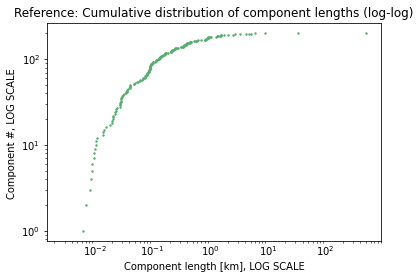

In [25]:
components_length = {}

for i, c in enumerate(ref_components):

    c_length = 0

    for (u, v, l) in c.edges(data="length"):

        c_length += l

    components_length[i] = c_length

components_df = pd.DataFrame.from_dict(components_length, orient="index")

components_df.rename(columns={0: "component_length"}, inplace=True)

plt.scatter(
    x=sorted(list(components_df["component_length"] / 1000)),
    y=[i for i in range(len(components_df))],
    s=2,
    color=pdict["base"],
)

plt.xscale("log")
plt.yscale("log")
plt.xlabel("Component length [km], LOG SCALE")
plt.ylabel("Component #, LOG SCALE ")
plt.title("Reference: Cumulative distribution of component lengths (log-log)");

plt.savefig(ref_results_plots_fp + "component_length_distribution.png", dpi=pdict["dpi"])


In [26]:
largest_cc = max(ref_components, key=len)

largest_cc_length = 0

for (u, v, l) in largest_cc.edges(data="length"):

    largest_cc_length += l

largest_cc_pct = largest_cc_length / components_df["component_length"].sum() * 100

print(
    f"The largest connected component contains {largest_cc_pct:.2f} % of the network length."
)

The largest connected component contains 80.04 % of the network length.


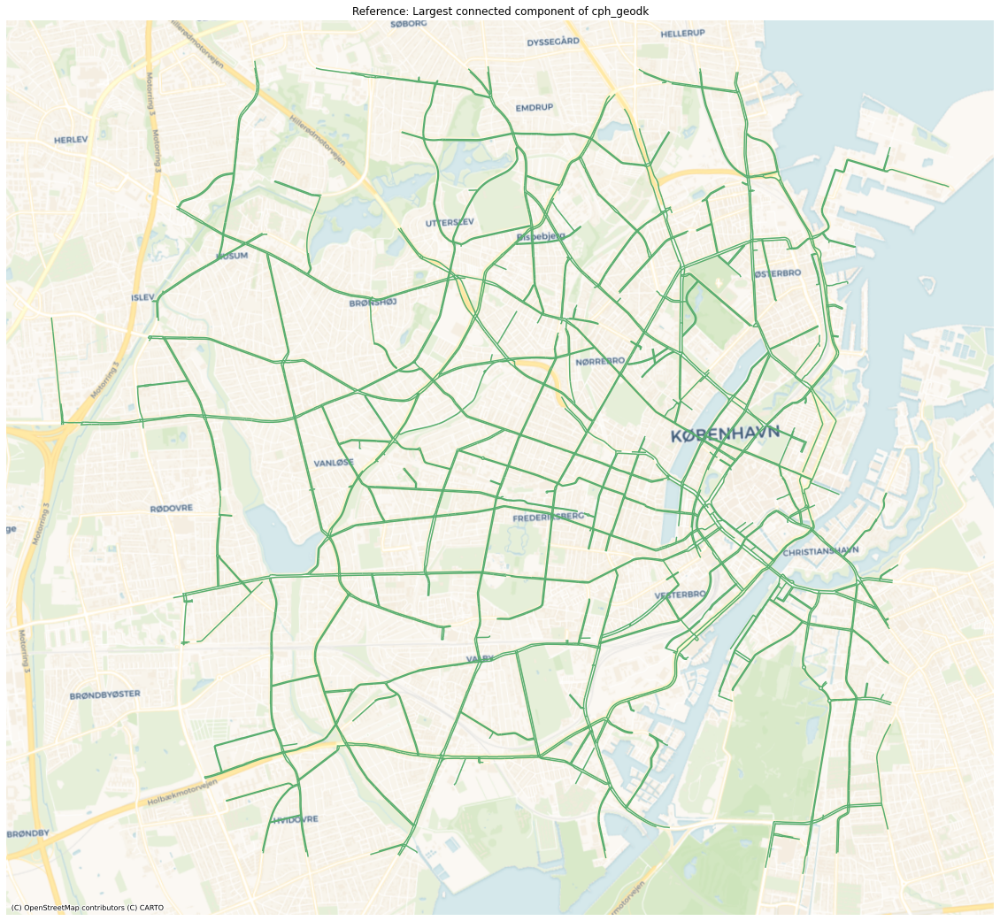

In [27]:
# Plot of largest connected component

lcc_edges = ox.graph_to_gdfs(
    G=largest_cc, nodes=False, edges=True, node_geometry=False, fill_edge_geometry=False
)

fig, ax = plt.subplots(1, 1, figsize=(20, 20))

lcc_edges.plot(ax=ax, color=pdict["base"])
ax.set_axis_off()
ax.set_title("Reference: Largest connected component of " + study_area)

cx.add_basemap(ax=ax, crs=study_crs, source=cx_tile_1)

fig.savefig(ref_results_static_maps_fp + f"largest_conn_comp.png", dpi=pdict["dpi"])

#### Identifying potential missing links between disconnected components

In the plot of potential missing links between components, all edges that are within the specified distance of an edge on another component are plotted. The gaps between disconnected edges are highlighted with a marker.
The map thus highlights edges which, despite being in close proximity of each other, are disconnected and where it thus would not be possible to bike on cycling infrastructure between the edges.

In [31]:
# DEFINE MAX BUFFER DISTANCE BETWEEN COMPONENTS CONSIDERED A GAP/MISSING LINK
component_min_distance = 10

assert isinstance(component_buffer_distance, int) or isinstance(
    component_buffer_distance, float
), print("Setting must be integer or float value!")

In [32]:
component_gaps = eval_func.find_adjacent_components(
    components=ref_components,
    buffer_dist=component_min_distance,
    crs=study_crs,
    edge_id="edge_id",
)
component_gaps_gdf = gpd.GeoDataFrame.from_dict(
    component_gaps, orient="index", geometry="geometry", crs=study_crs
)

edge_ids = set(
    component_gaps_gdf["edge_id" + "_left"].to_list()
    + component_gaps_gdf["edge_id" + "_right"].to_list()
)

edge_ids = [int(i) for i in edge_ids]
edges_with_gaps = ref_edges_simplified.loc[ref_edges_simplified.edge_id.isin(edge_ids)]

In [33]:
# Save to csv
pd.DataFrame(edge_ids,columns=['edge_id']).to_csv(ref_results_data_fp + f"component_gaps_edges_{component_min_distance}.csv", index=False)

In [35]:
# Folium plot of adjacent components

if len(component_gaps) > 0:

    simplified_edges_folium = plot_func.make_edgefeaturegroup(
        gdf=ref_edges_simplified,
        mycolor=pdict["osm_base"],
        myweight=pdict["line_base"],
        nametag="All edges",
        show_edges=True,
    )

    component_issues_edges_folium = plot_func.make_edgefeaturegroup(
        gdf=edges_with_gaps,
        mycolor=pdict["ref_emp"],
        myweight=pdict["line_emp"],
        nametag="Adjacent disconnected edges",
        show_edges=True,
    )

    component_issues_gaps_folium = plot_func.make_markerfeaturegroup(
        gdf=component_gaps_gdf,
        nametag="Component gaps",
        show_markers=True
    )

    m = plot_func.make_foliumplot(
        feature_groups=[
            simplified_edges_folium,
            component_issues_edges_folium,
            component_issues_gaps_folium,
        ],
        layers_dict=folium_layers,
        center_gdf=ref_nodes_simplified,
        center_crs=ref_nodes_simplified.crs,
    )

    bounds = plot_func.compute_folium_bounds(ref_nodes_simplified)
    m.fit_bounds(bounds)
    m.save(ref_results_inter_maps_fp + f"component_gaps_{component_min_distance}.html")


    display(m)

else:
    print("No component gaps to plot.")

#### Component connectivity

Visualizing differences between how many cells can be reached from each cell.

This is a crude measure for network connectivity but has the benefit of being computationally cheap and thus able to highlight stark differences in network connectivity in very little time.

In [36]:
ref_components_cell_count = eval_func.count_component_cell_reach(components_df, grid, 'component_ids_ref')
grid['cells_reached_ref'] = grid['component_ids_ref'].apply(lambda x: eval_func.count_cells_reached(x, ref_components_cell_count) if x != '' else 0)

grid['cells_reached_ref_pct'] = grid.apply(lambda x: np.round((x.cells_reached_ref / len(grid))*100, 2), axis = 1)

grid.loc[grid['cells_reached_ref_pct']==0,'cells_reached_ref_pct'] = np.NAN

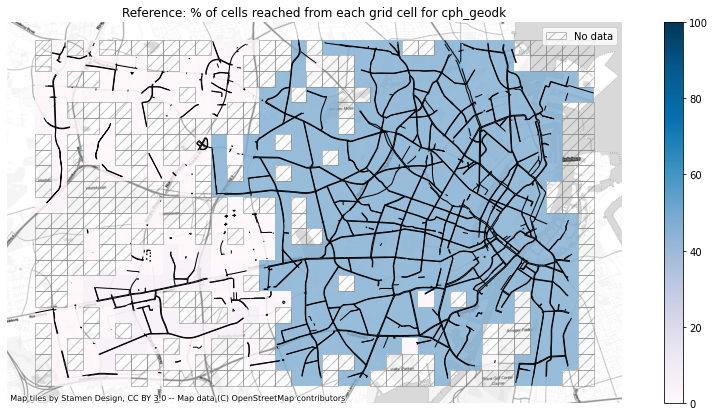

In [50]:
# set up figure
fig, ax = plt.subplots(1,1,figsize=pdict["fsmap"])

# norm for color bars
cbnorm_reach = colors.Normalize(vmin=0, vmax=100)
cbnorm_reach_diff = colors.Normalize(vmin=-100, vmax=100)

grid.plot(
    ax = ax, 
    column = "cells_reached_ref_pct",
    legend=True, 
    cmap = pdict["seq"],
    norm = cbnorm_reach,
    alpha = pdict["alpha_grid"])

ref_edges_simplified.plot(ax=ax, color=pdict["osm_base"], linewidth = pdict["line_base"])

# add no data patches
grid[grid["count_ref_edges"].isnull()].plot(
    ax=ax, facecolor=pdict["nodata_face"], edgecolor=pdict["nodata_edge"], hatch=pdict["nodata_hatch"], alpha=pdict["alpha_nodata"]
)

ax.legend(handles=[nodata_patch], loc="upper right")

cx.add_basemap(ax = ax, crs=study_crs, source=cx_tile_2)
ax.set_title('Reference: % of cells reached from each grid cell for ' + study_area)
ax.set_axis_off()

fig.savefig(ref_results_static_maps_fp + "percent_cells_reachable_grid.png", dpi=pdict["dpi"])

In [42]:
components_results = {}
components_results["component_count"] = len(ref_components)
components_results["largest_cc_pct_size"] = largest_cc_pct
components_results["largest_cc_length"] = largest_cc_length
components_results["count_adjacent_issues"] = len(component_gaps)

___________________

## 4. Summary

In [43]:
summarize_results = {**density_results, **components_results}

summarize_results["count_dangling_nodes"] = len(dangling_nodes)
summarize_results["count_overshoots"] = len(overshoots)
summarize_results["count_undershoots"] = len(undershoot_nodes)

summarize_results_df = pd.DataFrame.from_dict(summarize_results, orient="index")

summarize_results_df.rename({0: " "}, axis=1, inplace=True)

rename_metrics = {
    "edge_density_m_sqkm": "Meters of bicycle infrastructure per sqkm",
    "node_density_count_sqkm": "Nodes per sqkm",
    "dangling_node_density_count_sqkm": "Dangling nodes per sqkm",
    "protected_density_m_sqkm": "Meters of protected bicycle infrastructure per sqkm",
    "unprotected_density_m_sqkm": "Meters of unprotected bicycle infrastructure per sqkm",
    "mixed_density_m_sqkm": "Meters of mixed protection bicycle infrastructure per sqkm",
    "component_count": "Component count",
    "largest_cc_pct_size": "Largest component's share of network size",
    "largest_cc_length": "Size of largest component (m)",
    "count_component_gaps": "Count of component gaps",
    "count_dangling_nodes": "Count of dangling nodes",
    "count_overshoots": "Count of overshoots",
    "count_undershoots": "Count of undershoots",
}

summarize_results_df.rename(rename_metrics, inplace=True)

summarize_results_df.style.pipe(format_ref_style)

,
Meters of bicycle infrastructure per sqkm,"3,454"
Nodes per sqkm,23
Dangling nodes per sqkm,5
Meters of protected bicycle infrastructure per sqkm,"2,999"
Meters of unprotected bicycle infrastructure per sqkm,455
Meters of mixed protection bicycle infrastructure per sqkm,0
Component count,204
Largest component's share of network size,80%
Size of largest component (m),"501,460"
count_adjacent_issues,52


___________________

## 5. Save results

In [46]:
all_results = {}

all_results["network_density"] = density_results
all_results["count_overshoots"] = len(overshoots)
all_results["count_undershoots"] = len(undershoot_nodes)
all_results["dangling_node_count"] = len(dangling_nodes)
all_results["simplification_outcome"] = simplification_results
all_results["component_analysis"] = components_results

with open(ref_intrinsic_fp, "w") as outfile:
    json.dump(all_results, outfile)

# Save summary dataframe
summarize_results_df.to_csv(ref_results_data_fp + "intrinsic_summary_results.csv",index=True)

# Save grid with results
with open(ref_intrinsic_grid_fp, "wb") as f:
    pickle.dump(grid, f)